**Table of contents**<a id='toc0_'></a>    
- [Import packages](#toc1_)    
- [Define read and save path and load data](#toc2_)    
- [Set configs](#toc3_)    
- [Select time span](#toc4_)    
- [Impute missing data](#toc5_)    
- [Aggregate data](#toc6_)    
- [Normalise data](#toc7_)    
- [Dimensionality reduction](#toc8_)    
- [Find optimal k](#toc9_)    
- [Training](#toc10_)    
- [Cluster Analysis](#toc11_)    

<!-- vscode-jupyter-toc-config
	numbering=false
	anchor=true
	flat=false
	minLevel=1
	maxLevel=6
	/vscode-jupyter-toc-config -->
<!-- THIS CELL WILL BE REPLACED ON TOC UPDATE. DO NOT WRITE YOUR TEXT IN THIS CELL -->

# <a id='toc1_'></a>[Import packages](#toc0_)

In [1]:
import os
import random
import pickle
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from matplotlib.colors import to_hex
from importlib import reload

import sys
if Path('/content/drive/MyDrive').exists():
  sys.path.append('/content/drive/MyDrive/Colab Notebooks/custom_modules')
else:
  sys.path.append('./custom_modules')

import TSClustering
reload(TSClustering)
from TSClustering import TSClustering
from basic_funs import *

# <a id='toc2_'></a>[Define read and save path and load data](#toc0_)

In [2]:
local_path = Path('../data_preprocessed')
drive_path = Path('/content/drive/MyDrive/ProcessedData_Melbourne_Footfalls')

base_path = local_path if local_path.exists() else drive_path

save_dir = Path('../Results_test') if local_path.exists() else Path('/content/drive/MyDrive/Results_Melbourne_Footfalls')
if save_dir.exists() == False:
  save_dir.mkdir(parents=True, exist_ok=True)

read_processed_dir = base_path / '1. merged_peds_data_hist_curr'
read_raw_dir = Path('./Data (20230918)') if local_path.exists() else Path('/content/drive/MyDrive/Data/Melbourne_Footfalls')

In [3]:
data = read_file_with_stem(read_processed_dir, 'footfall_merged')
# data = pd.read_csv(read_processed_dir / 'footfall_merged.csv') # the data should be unpivoted
data.rename(columns={'New_Sensor_Name': 'Sensor_Name'}, inplace=True)
data.head()

find matched file(s): [PosixPath('../data_preprocessed/1. merged_peds_data_hist_curr/footfall_merged.csv')]
read ../data_preprocessed/1. merged_peds_data_hist_curr/footfall_merged.csv


,Date_Time,Sensor_Name,Hourly_Counts,Location_ID,Installation_Date,Location_Type,Status,Latitude,Longitude,Location,Year,Month,MDate,Day
0,2009-05-01 00:00:00,Bourke Street Mall (North) | Bou292_T [1],53,1,2009-03-24,Outdoor,A,-37.813494,144.965153,"-37.81349441, 144.96515323",2009,5,1,Friday
1,2009-05-01 00:00:00,Bourke Street Mall (South) | Bou283_T [2],52,2,2009-03-30,Outdoor,A,-37.813807,144.965167,"-37.81380668, 144.96516718",2009,5,1,Friday
2,2009-05-01 00:00:00,Collins Place (North) | Col12_T [18],36,18,2009-03-30,Outdoor,A,-37.813449,144.973054,"-37.81344862, 144.97305353",2009,5,1,Friday
3,2009-05-01 00:00:00,Collins Place (South) | Col15_T [17],28,17,2009-03-30,Outdoor,A,-37.813625,144.973236,"-37.81362543, 144.97323591",2009,5,1,Friday
4,2009-05-01 00:00:00,Flinders Street Station Underpass | FliS_T [6],139,6,2009-03-25,Outdoor,A,-37.819117,144.965583,"-37.81911705, 144.96558255",2009,5,1,Friday


# <a id='toc3_'></a>[Set configs](#toc0_)

    """
    Parameters:
    - data: by default is unpivot (wide format) hourly footfall data
    - metric: 
      "euclidean", "dtw", "softdtw" or None
    - scale: None or
      "day", 'week', 'month', 'year', 'hour'
      'early_morning', 'morning', 'midday', 'afternoon', 'evening'
      'workday', 'weekend'
    - pipeline: 
      "kmeans", "kshape", "kernelkmeans", "birch", "ensemble"
    - time_span: float, int or list
      "normal" (before 2020), 
      2019 (or other single year), 
      [start_date, end_date] or None
    - normalise: 
      "meanvariance", "minmax" or None
    - feature_extraction: 
      True, False or None
    - dim_reduction: 
      'PCA', 'IPCA' or None
    - "order_of_impute_agg": 
      "impute_agg_norm", "impute_norm_agg", "agg_impute_norm", or "agg_norm_impute"
    """

In [4]:
model_configs = {
  "metric": 'dtw',
  "random_state": 42
}

configs = {
  "data": data.copy(),
  "target_column": 'Sensor_Name', # target (sensor name)
  "time_column": 'Date_Time', # feature names (timestamp)
  "value_column": 'Hourly_Counts', # value
  "sensor_locations": data[['Sensor_Name', 'Latitude', 'Longitude', 'Location']],
  "save_dir": save_dir,
  "algorithm": 'kmeans',
  "scale": 'week', 
  "order_of_impute_agg_norm": "impute_agg_norm", 
  "time_span": 2019, 
  "feature_extraction": None, 
  "dim_reduction": "PCA", 
  "normalise": "meanvariance", 
  # "model_configs": model_configs, 
  "seed": 42,
  "verbose": False
}

In [5]:
pipeline = TSClustering(**configs)
pipeline.set_save_dir(Path('../Results_test')) # set save dir
# configs = pipeline.global_configs

the model's configs are set as default values.


In [6]:
data = data.pivot(index=configs["target_column"], columns=configs["time_column"], values=configs["value_column"])
data.columns = pd.to_datetime(data.columns)
data.head()

Date_Time,2009-05-01 00:00:00,2009-05-01 01:00:00,2009-05-01 02:00:00,2009-05-01 03:00:00,2009-05-01 04:00:00,2009-05-01 05:00:00,2009-05-01 06:00:00,2009-05-01 07:00:00,2009-05-01 08:00:00,2009-05-01 09:00:00,...,2023-09-18 16:00:00,2023-09-18 17:00:00,2023-09-18 18:00:00,2023-09-18 19:00:00,2023-09-18 20:00:00,2023-09-18 21:00:00,2023-09-18 22:00:00,2023-09-18 23:00:00,2023-09-19 00:00:00,2023-09-19 01:00:00
Sensor_Name,,,,,,,,,,,,,,,,,,,,,
114 Flinders Street Car Park Crossing | Fli114C_T [118],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,37.0,61.0,38.0,6.0,8.0,6.0,10.0,3.0,NaN,NaN
114 Flinders Street Car Park Footpath | Fli114F_T [117],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,314.0,423.0,274.0,145.0,123.0,101.0,92.0,32.0,10.0,2.0
231 Bourke St | Bou231_T [63],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,555.0,573.0,516.0,325.0,303.0,235.0,162.0,76.0,42.0,3.0
Alfred Place | AlfPl_T [39],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,140.0,255.0,117.0,47.0,33.0,25.0,22.0,6.0,1.0,NaN
Birrarung Marr East-Batman Ave Bridge Entry | BirBridge_T [123],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,46.0,80.0,66.0,4.0,2.0,2.0,NaN,2.0,NaN,NaN


# <a id='toc4_'></a>[Select time span](#toc0_)

In [7]:
data19 = pipeline.select_time_span(data)
pipeline.plot_data(data=data19, fig_name='plot_raw_data')
data19.head()

--------------------------------------------------
the data shape before cutting is (80, 121501)
select data in 2019
the data shape after cutting is (53, 8760)
the data range: 2019-01-01 00:00:00 - 2019-12-31 23:00:00
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA created.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data.csv will be updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data.csv saved.
plot the plot_raw_data .....
(53, 8760)
7 8
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/plot_raw_data_2019_with_shade.png updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA exists and will not be updated.


Date_Time,2019-01-01 00:00:00,2019-01-01 01:00:00,2019-01-01 02:00:00,2019-01-01 03:00:00,2019-01-01 04:00:00,2019-01-01 05:00:00,2019-01-01 06:00:00,2019-01-01 07:00:00,2019-01-01 08:00:00,2019-01-01 09:00:00,...,2019-12-31 14:00:00,2019-12-31 15:00:00,2019-12-31 16:00:00,2019-12-31 17:00:00,2019-12-31 18:00:00,2019-12-31 19:00:00,2019-12-31 20:00:00,2019-12-31 21:00:00,2019-12-31 22:00:00,2019-12-31 23:00:00
Sensor_Name,,,,,,,,,,,,,,,,,,,,,
Alfred Place | AlfPl_T [39],207.0,99.0,60.0,21.0,15.0,31.0,17.0,31.0,46.0,116.0,...,204.0,198.0,149.0,149.0,164.0,199.0,223.0,158.0,309.0,205.0
"Birrarung Marr | FedPed_T, FedCycle_T [7, 122]",2733.0,1086.0,571.0,208.0,83.0,46.0,48.0,49.0,65.0,116.0,...,323.0,360.0,447.0,432.0,559.0,1267.0,2128.0,3772.0,3257.0,2401.0
Bourke St Bridge | BouBri_T [57],NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,293.0,287.0,375.0,328.0,302.0,408.0,372.0,590.0,1256.0,1380.0
Bourke St-Russell St (West) | Rus180_T [21],1745.0,1722.0,1113.0,786.0,405.0,249.0,117.0,76.0,99.0,131.0,...,1227.0,1137.0,1229.0,1225.0,1367.0,1597.0,1726.0,1615.0,1860.0,1546.0
Bourke St-Spencer St (North) | Bou688_T [58],1286.0,934.0,451.0,340.0,160.0,104.0,100.0,129.0,182.0,319.0,...,1087.0,1265.0,1092.0,1109.0,987.0,794.0,837.0,802.0,889.0,801.0


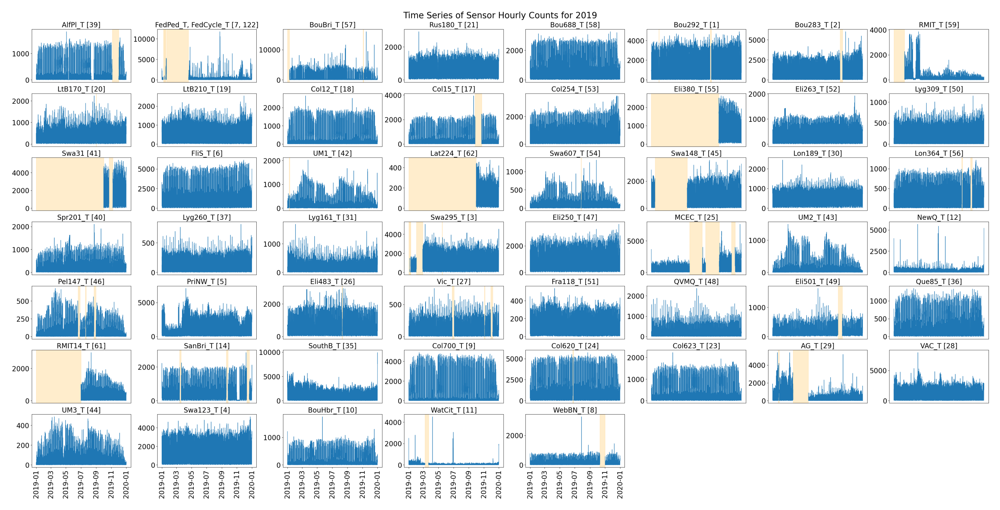

In [8]:
pipeline.load_image(file_name='plot_raw_data_2019_with_shade.png')

# <a id='toc5_'></a>[Impute missing data](#toc0_)

general steps for imputation for now:

1. determine the average missing rate (a%) for the data.
2. identify sensors with complete data.
3. various interpolation methods are tested to determine the best one based on performance metrics.
   - for each set of complete data, remove a percentage (a%) of values at random to simulate missing data.
   - impute the artificially created missing data using various interpolation methods.
   - compute the performance metric score by comparing the imputed data against the original complete data (before introducing the missing values). 
4. the best interpolation method is applied to the dataset to fill in missing values.
5. any remaining missing values after interpolation are set to zero.

The interpolation methods we covered: Time, Linear, Quadratic, Cubic, Polynomial (Order 5), Polynomial (Order 3), Slinear, Nearest

In [9]:
data19_imputed = pipeline.impute_data(data19)
pipeline.plot_data(fig_name='plot_imputed_data')
data19_imputed.head()

--------------------------------------------------
impute the missing values.....
the size of data before imputation: (53, 8760)
number of missing values in data: 41134
load ../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data_missing_value_filled.csv.....
The size of data after imputation is (53, 8760)
plot the plot_imputed_data .....
(53, 8760)
7 8
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/plot_imputed_data_2019_with_shade.png updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA exists and will not be updated.


Date_Time,2019-01-01 00:00:00,2019-01-01 01:00:00,2019-01-01 02:00:00,2019-01-01 03:00:00,2019-01-01 04:00:00,2019-01-01 05:00:00,2019-01-01 06:00:00,2019-01-01 07:00:00,2019-01-01 08:00:00,2019-01-01 09:00:00,...,2019-12-31 14:00:00,2019-12-31 15:00:00,2019-12-31 16:00:00,2019-12-31 17:00:00,2019-12-31 18:00:00,2019-12-31 19:00:00,2019-12-31 20:00:00,2019-12-31 21:00:00,2019-12-31 22:00:00,2019-12-31 23:00:00
Sensor_Name,,,,,,,,,,,,,,,,,,,,,
Alfred Place | AlfPl_T [39],207.0,99.0,60.0,21.0,15.0,31.0,17.0,31.0,46.0,116.0,...,204.0,198.0,149.0,149.0,164.0,199.0,223.0,158.0,309.0,205.0
"Birrarung Marr | FedPed_T, FedCycle_T [7, 122]",2733.0,1086.0,571.0,208.0,83.0,46.0,48.0,49.0,65.0,116.0,...,323.0,360.0,447.0,432.0,559.0,1267.0,2128.0,3772.0,3257.0,2401.0
Bourke St Bridge | BouBri_T [57],0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,293.0,287.0,375.0,328.0,302.0,408.0,372.0,590.0,1256.0,1380.0
Bourke St-Russell St (West) | Rus180_T [21],1745.0,1722.0,1113.0,786.0,405.0,249.0,117.0,76.0,99.0,131.0,...,1227.0,1137.0,1229.0,1225.0,1367.0,1597.0,1726.0,1615.0,1860.0,1546.0
Bourke St-Spencer St (North) | Bou688_T [58],1286.0,934.0,451.0,340.0,160.0,104.0,100.0,129.0,182.0,319.0,...,1087.0,1265.0,1092.0,1109.0,987.0,794.0,837.0,802.0,889.0,801.0


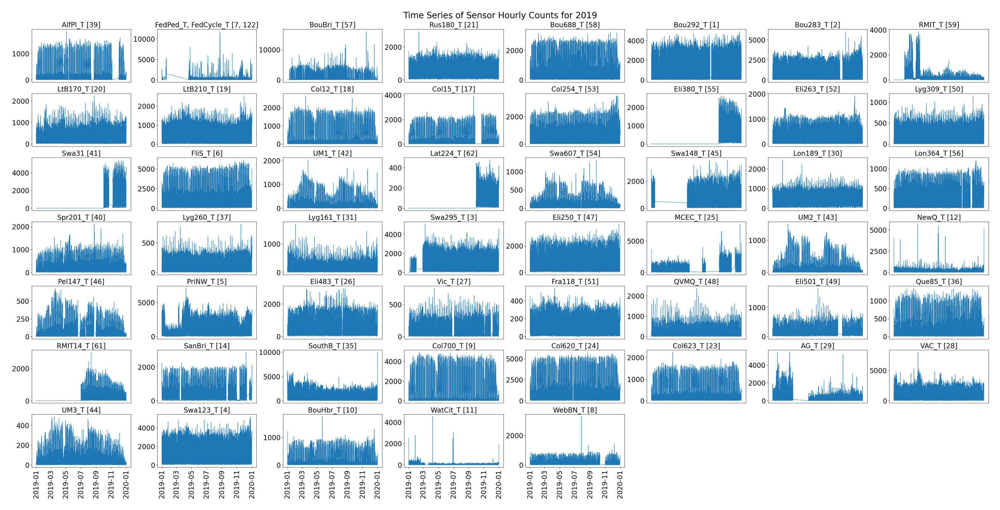

In [10]:
pipeline.load_image(file_name='plot_imputed_data_2019_with_shade.png')

# <a id='toc6_'></a>[Aggregate data](#toc0_)

In [11]:
data19_agg = pipeline.aggregation(data19_imputed)
pipeline.plot_data(fig_name='plot_aggregated_data')
data19_agg.head()

--------------------------------------------------
the data size before aggregation is (53, 8760)
the data will be aggregated by week
the aggregated data size is (53, 53)
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA created.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data_aggregated.csv will be updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data_aggregated.csv saved.
plot the plot_aggregated_data .....
(53, 53)
7 8
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/plot_aggregated_data_2019_with_shade.png updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA exists and will not be updated.


Date_Time,2019-01-06,2019-01-13,2019-01-20,2019-01-27,2019-02-03,2019-02-10,2019-02-17,2019-02-24,2019-03-03,2019-03-10,...,2019-11-03,2019-11-10,2019-11-17,2019-11-24,2019-12-01,2019-12-08,2019-12-15,2019-12-22,2019-12-29,2020-01-05
Sensor_Name,,,,,,,,,,,,,,,,,,,,,
Alfred Place | AlfPl_T [39],20758.0,41640.0,45623.0,46403.0,40995.0,49467.0,50127.0,49639.0,51163.0,48475.0,...,52139.0,6446.576,4238.0352,7353.9648,10503.424,51789.0,46077.0,42242.0,17312.0,6012.0
"Birrarung Marr | FedPed_T, FedCycle_T [7, 122]",41159.0,29410.43299,191810.360646,238402.14132,218908.166589,199414.191858,179920.217127,160426.242396,140932.267665,121438.292934,...,38378.0,43478.0,98464.0,129861.0,40383.0,44795.0,50506.0,27245.0,66186.0,18473.0
Bourke St Bridge | BouBri_T [57],0.0,69441.0,151311.0,146011.0,130274.0,147913.0,191751.0,187940.0,159228.0,165505.0,...,113978.938776,63411.061224,147333.0,195832.0,114000.0,102094.0,102054.0,127015.0,35333.0,13625.0
Bourke St-Russell St (West) | Rus180_T [21],89654.0,103517.0,102528.0,101865.0,98152.0,129148.0,113895.0,122544.0,104745.0,115104.0,...,101467.0,102127.0,112985.0,114215.0,113726.0,115379.0,108850.0,102540.0,108162.0,30315.0
Bourke St-Spencer St (North) | Bou688_T [58],75005.0,122907.0,134270.0,131089.0,115110.0,136480.0,139116.0,145220.0,139416.0,140536.0,...,137238.0,120875.0,147024.0,149483.0,144609.0,140694.0,142831.0,137077.0,88426.0,26787.0


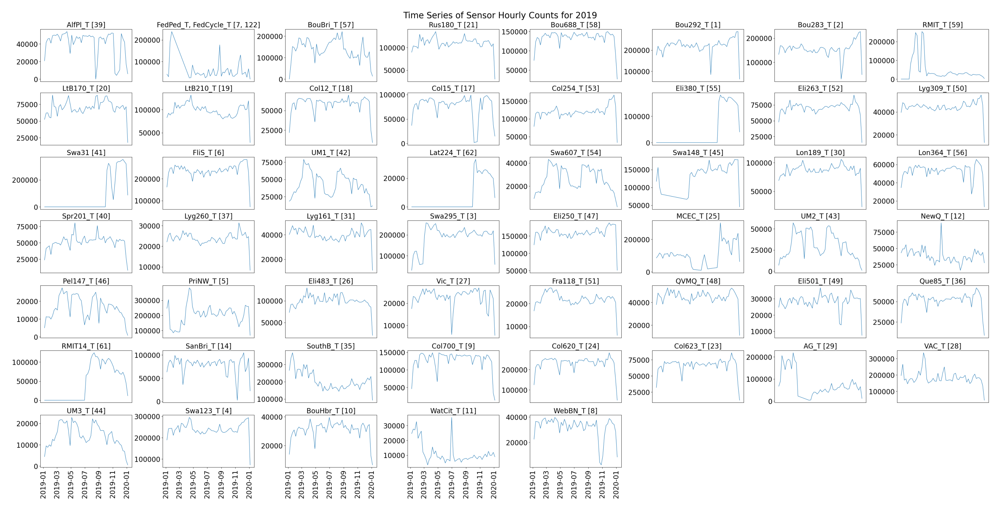

In [12]:
pipeline.load_image(file_name='plot_aggregated_data_2019_with_shade.png')

# <a id='toc7_'></a>[Normalise data](#toc0_)

In [13]:
data19_norm = pipeline.normalise_data(data19_agg)
pipeline.plot_data(fig_name='plot_normalised_data')
data19_norm.head()

--------------------------------------------------
normalising the data.....
loading the scaled data.....
the size of scaled data is (53, 53)
if the scaled data sorted by time?: True
missing value in scaled data: 0
plot the plot_normalised_data .....
(53, 53)
7 8
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/plot_normalised_data_2019_with_shade.png updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA exists and will not be updated.


,2019-01-06,2019-01-13,2019-01-20,2019-01-27,2019-02-03,2019-02-10,2019-02-17,2019-02-24,2019-03-03,2019-03-10,...,2019-11-03,2019-11-10,2019-11-17,2019-11-24,2019-12-01,2019-12-08,2019-12-15,2019-12-22,2019-12-29,2020-01-05
Sensor_Name,,,,,,,,,,,,,,,,,,,,,
Alfred Place | AlfPl_T [39],-1.357183,0.048907,0.317102,0.369623,0.005476,0.575938,0.620379,0.587519,0.690138,0.509142,...,0.755857,-2.320842,-2.469555,-2.259743,-2.047675,0.732290,0.347672,0.089442,-1.589219,-2.350105
"Birrarung Marr | FedPed_T, FedCycle_T [7, 122]",-0.552737,-0.765044,2.169665,3.011620,2.659346,2.307073,1.954800,1.602527,1.250253,0.897980,...,-0.602993,-0.510831,0.482814,1.050186,-0.566760,-0.487032,-0.383829,-0.804176,-0.100478,-0.962693
Bourke St Bridge | BouBri_T [57],-2.903420,-1.426824,0.314063,0.201364,-0.133268,0.241808,1.173981,1.092944,0.482411,0.615885,...,-0.479767,-1.555045,0.229475,1.260760,-0.479319,-0.732489,-0.733339,-0.202568,-2.152098,-2.613698
Bourke St-Russell St (West) | Rus180_T [21],-1.442996,-0.453020,-0.523646,-0.570992,-0.836142,1.377325,0.288087,0.905724,-0.365327,0.374423,...,-0.599414,-0.552282,0.223103,0.310939,0.276018,0.394061,-0.072183,-0.522789,-0.121314,-5.680476
Bourke St-Spencer St (North) | Bou688_T [58],-2.922818,-0.535514,0.030786,-0.127746,-0.924095,0.140927,0.272298,0.576504,0.287249,0.343066,...,0.178703,-0.636784,0.666410,0.788960,0.546054,0.350941,0.457443,0.170679,-2.253952,-5.325871


# <a id='toc8_'></a>[Dimensionality reduction](#toc0_)

--------------------------------------------------
Now applying PCA to data
plot_pca_heatmap.png saved.
the data size after dimensionality reduction: (53, 18)
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA created.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data_reduced.csv will be updated.
../Results_test/euclidean_kmeans_norm-meanvariance_scale-week_span-2019/order-impute_agg_norm_fea-None_dr-PCA/data_reduced.csv saved.


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
Sensor_Name,,,,,,,,,,,,,,,,,,
Alfred Place | AlfPl_T [39],-1.489767,1.726457,1.864694,-0.681684,1.172286,-2.099440,3.454155,3.765937,0.077777,1.446224,-0.582058,-0.686957,1.999203,0.286750,-0.240822,-0.383371,-0.799857,-0.413006
"Birrarung Marr | FedPed_T, FedCycle_T [7, 122]",2.057418,5.290358,1.546016,-3.144720,-1.242592,-0.867732,-2.636481,-0.512015,1.333917,-0.121853,0.893563,-0.163862,0.654730,1.484492,-0.585791,0.179863,0.356286,0.741951
Bourke St Bridge | BouBri_T [57],-3.086733,1.531236,-0.007920,-2.350630,1.376716,0.072833,-1.134363,-1.518680,0.102325,1.138129,-0.650387,1.506935,1.824013,0.316957,-0.358404,0.457757,1.422247,-1.111354
Bourke St-Russell St (West) | Rus180_T [21],-1.082559,-0.004267,-1.891832,1.859233,-0.214341,-1.924797,-0.814346,-0.751325,0.592258,-0.173595,-0.542778,-0.152139,-0.493673,1.394145,0.163018,-0.401174,-0.693343,-0.256539
Bourke St-Spencer St (North) | Bou688_T [58],-2.260165,-0.761857,-1.984555,-1.326946,-0.011408,-0.280008,1.017692,-0.486508,-0.728002,-0.284121,0.039557,0.284617,0.586218,0.057351,-0.070638,0.221058,0.254927,0.022215


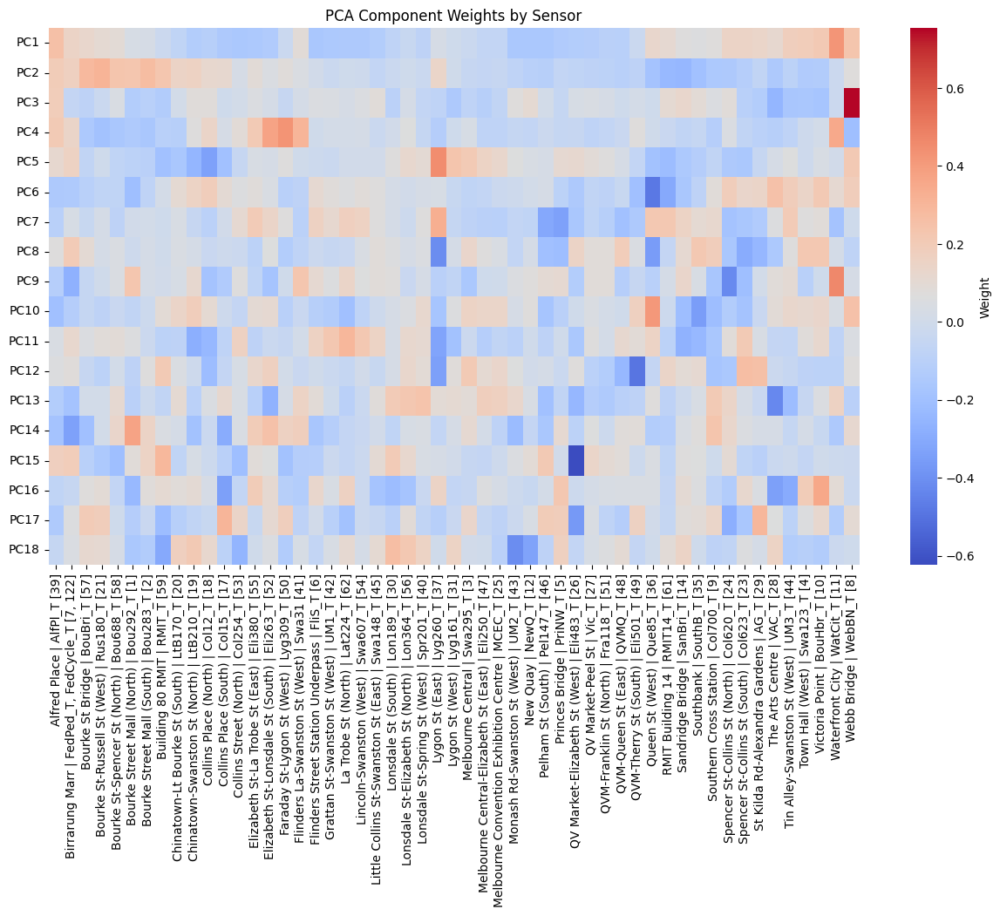

In [14]:
data19_dr = pipeline.dimensionality_reduction(data19_norm)
data19_dr.head()

# <a id='toc9_'></a>[Find optimal k](#toc0_)

2 best k will be found:

1. the elbow point of elbow plot
2. the value with the highest average rank based on the following metrics: Silhouette Score, Davies-Bouldin Index, and Calinski-Harabasz Index.

In [15]:
pipeline.optimal_k()

--------------------------------------------------
finding the optimal k.....
the best k are [5]


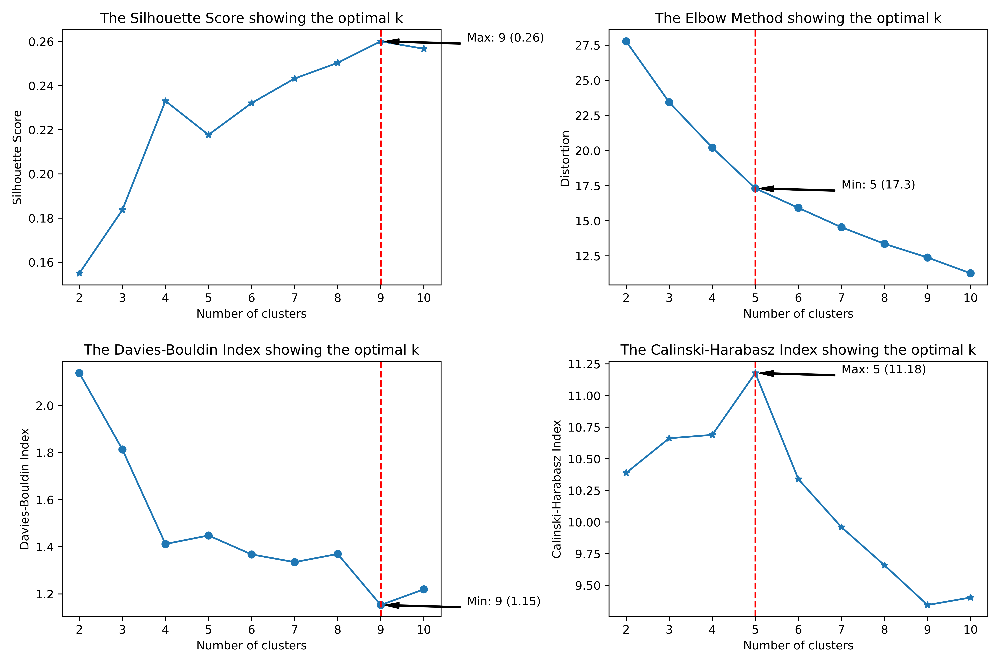

In [16]:
pipeline.load_image(file_name='plot_best_k.png')

# <a id='toc10_'></a>[Training](#toc0_)

In [17]:
%%capture
pipeline.data_raw = data19_agg
pipeline.data_raw_norm = data19_norm
pipeline.training_each_k()

In [18]:
pipeline.load_image(file_name=f'best_k_{min(pipeline.best_k)}/cluster_assignments_raw_norm.png')

In [19]:
with open(save_dir / 'pipeline.pkl', 'wb') as file:
  pickle.dump(pipeline, file)

# 